Camera Calibration
===


In [1]:
import numpy as np
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

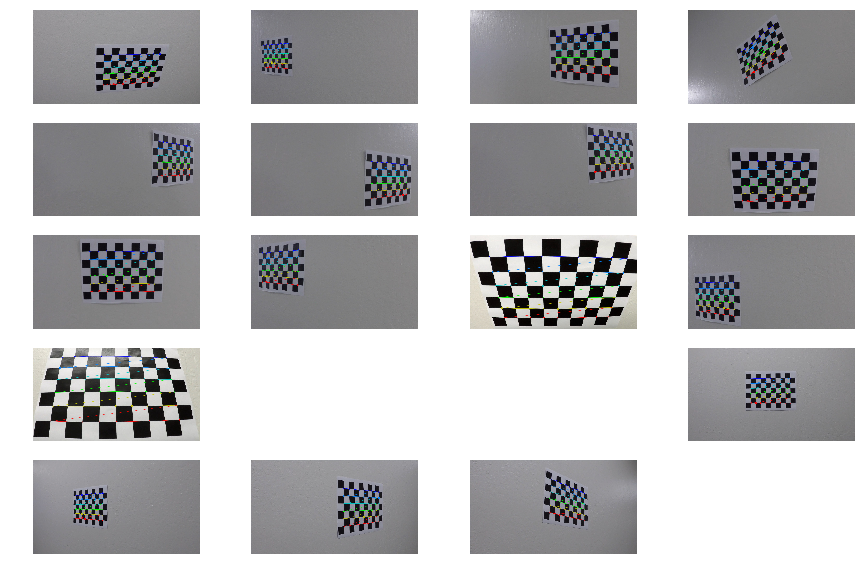

In [2]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/*.jpg')
plt.figure(figsize=(15,10))

# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = mpimg.imread(fname)
    
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (9,6), corners, ret)
        #write_name = 'corners_found'+str(idx)+'.jpg'
        #cv2.imwrite(write_name, img)
        plt.subplot(5,4,idx)
        plt.imshow(img)
        
        plt.axis('off')
        

Calculate and Test undistortion
===

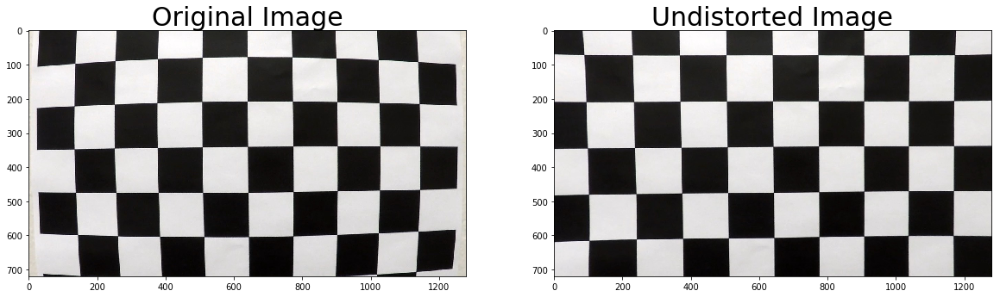

In [3]:
import pickle
%matplotlib inline

# Test undistortion on an image
img = mpimg.imread('camera_cal/test.jpg')
img_size = (img.shape[1], img.shape[0])

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

dst = cv2.undistort(img, mtx, dist, None, mtx)
#dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)

# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)
plt.savefig('output_images/undistort_output.png')

Undistort Raw Images
====

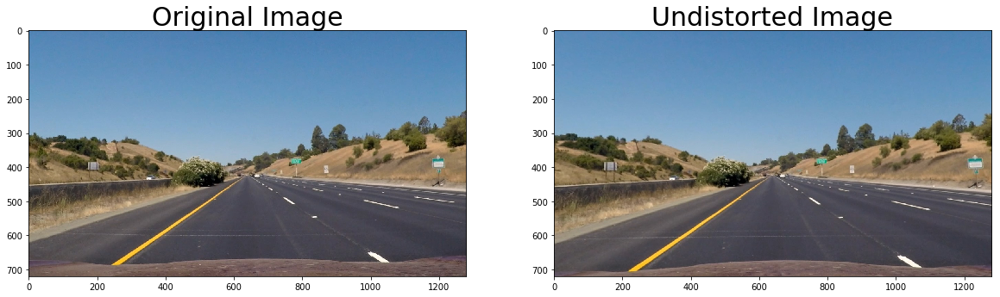

In [4]:

def undistort(img):
    """This Fucntion removes distortion in the Input Image.
    
    Args:
    img: 3D-Image
    
    returns:
    Undistorted Version of Input Image
    """  
    return cv2.undistort(img, mtx, dist, None, mtx)



# Visualize undistortion
img = mpimg.imread('test_images/straight_lines1.jpg')

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(undistort(img))
ax2.set_title('Undistorted Image', fontsize=30)

plt.savefig('./output_images/test1.jpg')  


Perspective Transform
====

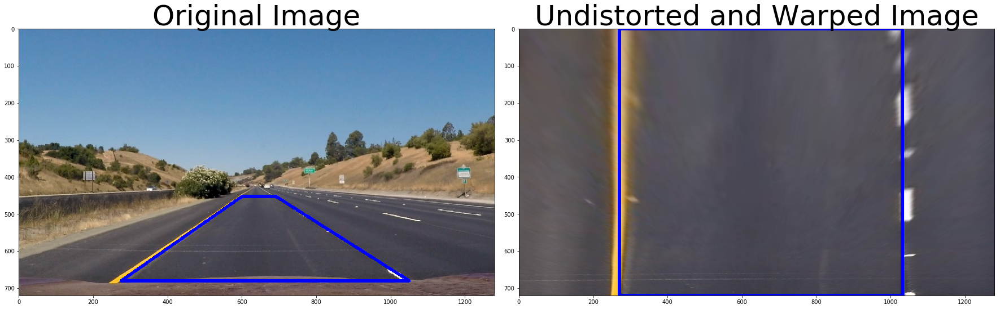

In [5]:
def unwarp(img):
    """This Fucntion calculates the perspective transform of Input Image.
    
    Args:
    img: Undistorted Input Image
    
    returns:
    warped: Perspective transform of the input image 
    Minv: Inverse Perspective Matrix
    """    

    img_size=(img.shape[1],img.shape[0]) # Size of the Undistorted Image
    imshape=img.shape
    #Source Points
    src = np.float32([[600,452],[691,452],[275,680],[1050,680]]) 
    
    #Destination points
    dst = np.float32([[330,0],[1050,0],[270,img.shape[0]],[1060,img.shape[0]]])
    
    #Obtain Perspective tansform matrix
    M=cv2.getPerspectiveTransform(src,dst)
    
    #Apply Perspective transform
    warped=cv2.warpPerspective(img,M,img_size,flags=cv2.INTER_LINEAR)
    
    #Obtain Inverse Perspective transform matrix
    Minv=cv2.getPerspectiveTransform(dst,src)
    
    return warped,Minv

#Visualization of Unwarped Images
#images = glob.glob('test_images/*.jpg')
#unwarped_images=[]
#for idx, fname in enumerate(images):
#img = mpimg.imread(fname)
img = mpimg.imread('test_images/straight_lines1.jpg')
undistorted_image=undistort(img)
unwarped_image,nom =unwarp(undistorted_image)

src = np.float32([[600,452],[691,452],[275,680],[1050,680]])
dst = np.float32([[330,0],[1050,0],[270,img.shape[0]],[1060,img.shape[0]]])
cv2.line(img,(600,452),(691,452),[0,0,255], 7)
cv2.line(img, (691,452), (1050,680),[0,0,255], 7)
cv2.line(img,(1050,680),(275,680),[0,0,255], 7)
cv2.line(img, (275,680),(600,452) , [0,0,255], 7)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()    
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
unwarped_image=cv2.rectangle(unwarped_image,(270,0),(1030,720),(0,0,255),7)
ax2.imshow(unwarped_image)
ax2.set_title('Undistorted and Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    

Color & Gradient Thresholding
===

Color Spaces
---

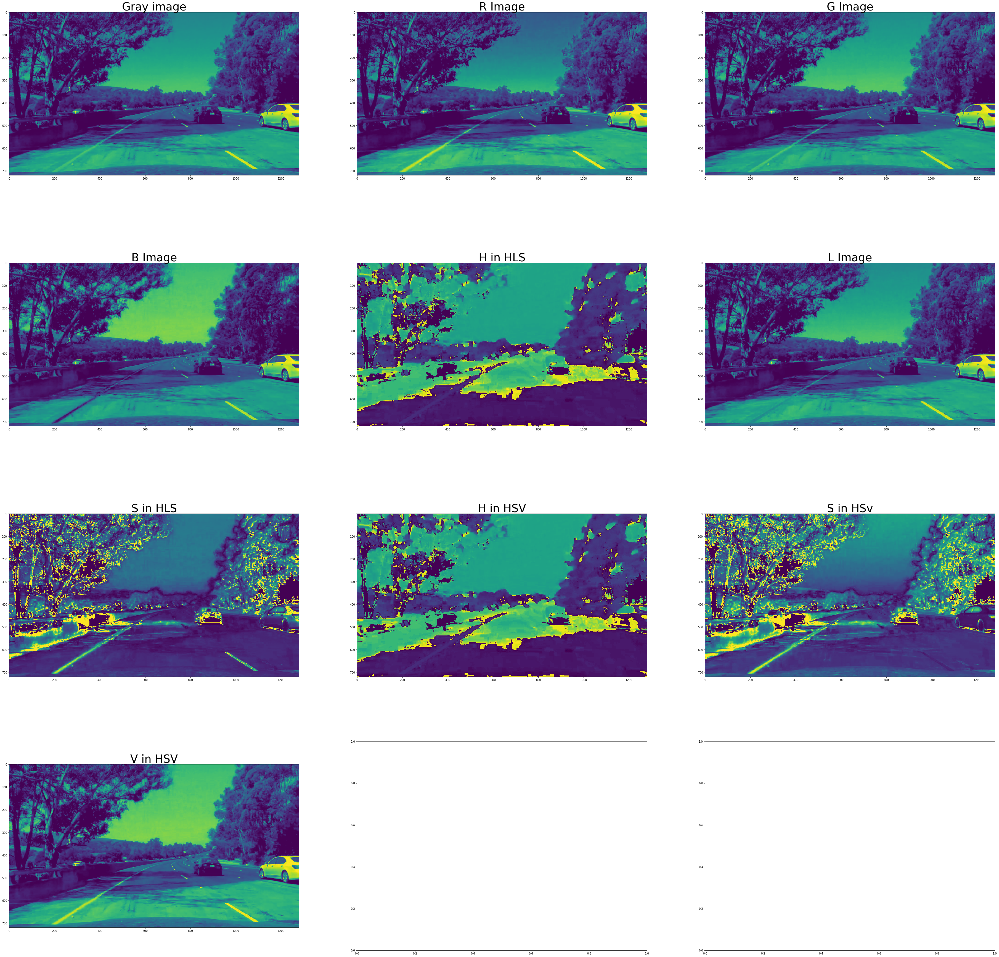

In [6]:
def hls_image(img):
    """
    This Fucntion Converts input Image to HLS color space
    Args:
    img: Undistorted Input Image
    
    returns:
    Image in HLS color space
    """
    return cv2.cvtColor(img,cv2.COLOR_RGB2HLS)

def hsv_image(img):
    """
    This Fucntion Converts input Image to HSV color space
    Args:
    img: Undistorted Input Image
    
    returns:
    Image in HSV color space
    """
    return cv2.cvtColor(img,cv2.COLOR_RGB2HSV)

#Visualization of Input Image in different Color Spaces
#img = mpimg.imread('test_images/test1.jpg')
img = mpimg.imread('clip/frame1035.jpg')
undistorted_image=undistort(img)

gray=cv2.cvtColor(undistorted_image,cv2.COLOR_RGB2GRAY)

#RGB Space
r=undistorted_image[:,:,0]
g=undistorted_image[:,:,1]
b=undistorted_image[:,:,2]

#HLS Space
hls=hls_image(undistorted_image)
h_hls=hls[:,:,0]
l_hls=hls[:,:,1]
s_hls=hls[:,:,2]

#HSV Space
hsv=hsv_image(undistorted_image)
h_hsv=hsv[:,:,0]
s_hsv=hsv[:,:,1]
v_hsv=hsv[:,:,2]

f,axs=plt.subplots(4,3,figsize=(64,64))
ax=axs.ravel()
ax[0].imshow(gray)
ax[0].set_title("Gray image",fontsize=40)
ax[1].imshow(r)
ax[1].set_title("R Image",fontsize=40)
ax[2].imshow(g)
ax[2].set_title("G Image",fontsize=40)
ax[3].imshow(b)
ax[3].set_title("B Image",fontsize=40)
ax[4].imshow(h_hls)
ax[4].set_title("H in HLS",fontsize=40)
ax[5].imshow(l_hls)
ax[5].set_title("L Image",fontsize=40)
ax[6].imshow(s_hls)
ax[6].set_title("S in HLS",fontsize=40)
ax[7].imshow(h_hsv)
ax[7].set_title("H in HSV",fontsize=40)
ax[8].imshow(s_hsv)
ax[8].set_title("S in HSv",fontsize=40)
ax[9].imshow(v_hsv)
ax[9].set_title("V in HSV",fontsize=40)

plt.savefig('output_images/color_spaces.png')


From Above Images we can see that Lane lines are cleary visible in S-channel in HLS Transform

Color Thresholding
---

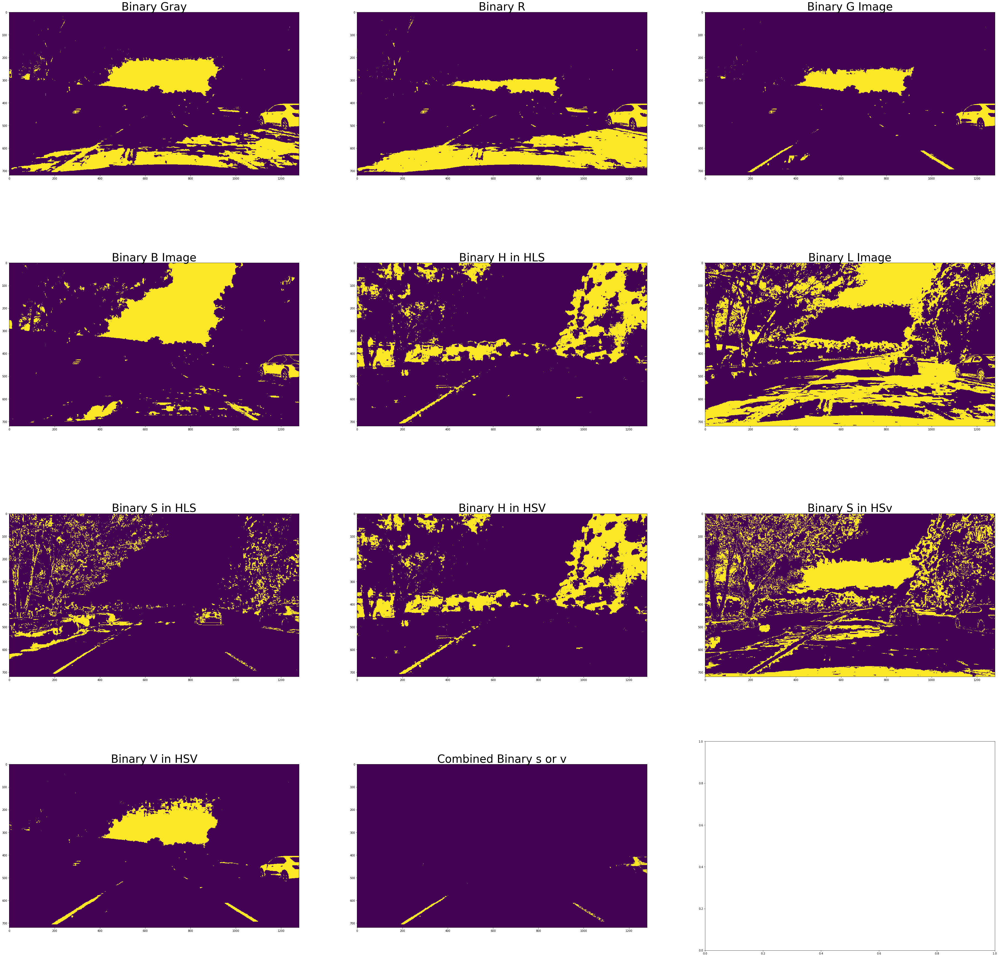

In [7]:
def binarize(img,threshold=(0,255)):
    """This Fucntion Creates a binary image of ones where threshold is met, zeros otherwise
    
    Args:
    img: Undistorted Input Image
    threshold: A tuple of min and max value
    
    returns:
    binary: Binary version of the input image
    """  
    binary=np.zeros_like(img)
    binary[(img>threshold[0]) & (img<=threshold[1])]=1
    return binary

binary_gray=binarize(gray,(150,255))

binary_R=binarize(r,(150,255))
binary_G=binarize(g,(170,255))
binary_B=binarize(b,(150,230))

binary_h_hls=binarize(h_hls,(20,40))
binary_l_hls=binarize(l_hls,(50,150))
binary_s_hls=binarize(s_hls,(170,255))

binary_h_hsv=binarize(h_hsv,(20,40))
binary_s_hsv=binarize(s_hsv,(50,100))
binary_v_hsv=binarize(v_hsv,(190,255))

binary_s_gray = np.zeros_like(binary_gray)
binary_s_gray[(binary_s_hls == 1) & (binary_v_hsv==1) ] = 1

#Visualization of Color Thresholding
f,axs=plt.subplots(4,3,figsize=(64,64))
ax=axs.ravel()
ax[0].imshow(binary_gray)
ax[0].set_title("Binary Gray",fontsize=40)
ax[1].imshow(binary_R)
ax[1].set_title("Binary R",fontsize=40)
ax[2].imshow(binary_G)
ax[2].set_title("Binary G Image",fontsize=40)
ax[3].imshow(binary_B)
ax[3].set_title("Binary B Image",fontsize=40)
ax[4].imshow(binary_h_hls)
ax[4].set_title("Binary H in HLS",fontsize=40)
ax[5].imshow(binary_l_hls)
ax[5].set_title("Binary L Image",fontsize=40)
ax[6].imshow(binary_s_hls)
ax[6].set_title("Binary S in HLS",fontsize=40)
ax[7].imshow(binary_h_hsv)
ax[7].set_title("Binary H in HSV",fontsize=40)
ax[8].imshow(binary_s_hsv)
ax[8].set_title("Binary S in HSv",fontsize=40)
ax[9].imshow(binary_v_hsv)
ax[9].set_title("Binary V in HSV",fontsize=40)
ax[10].imshow(binary_s_gray)
ax[10].set_title("Combined Binary s or v",fontsize=40)
plt.savefig('output_images/color_thresholding.png')

Gradient Thresholidng
---

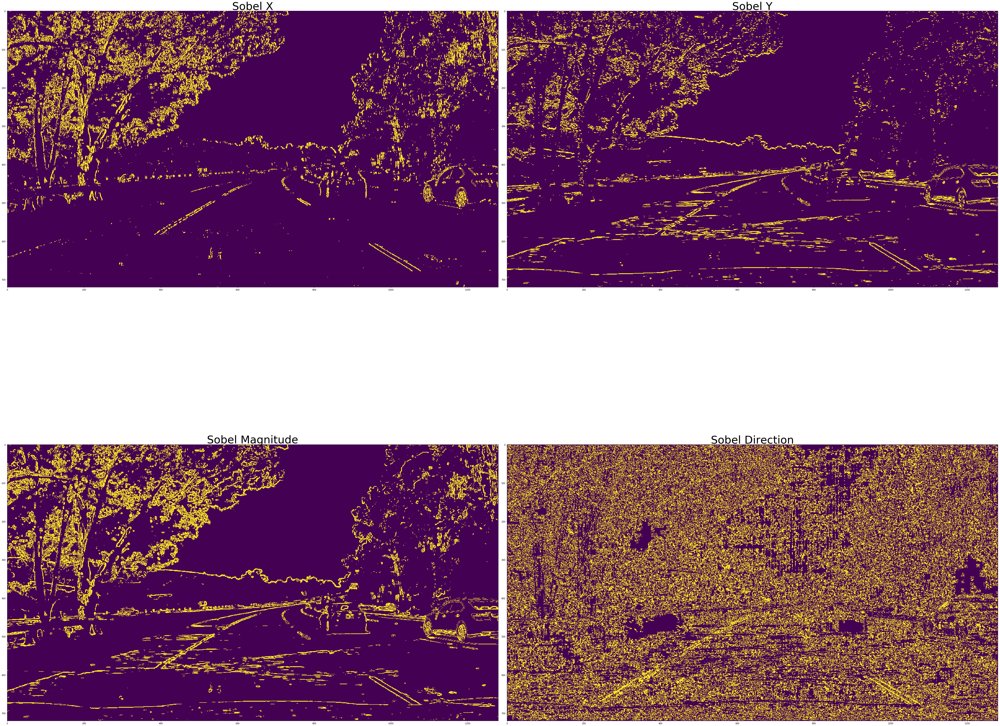

In [8]:
def abs_Sobel(img,orient='x',threshold=(0,255)):
    """This function Applies Sobel derivative in 'x' or 'y' orientation 
    
    Args:
    img -- 3-D image or 2-D image
    orient -- 'x' or 'y'
    threshold -- A tuple of min and max value 
    returns:
    binary -- Binary image of  ones where threshold is met, zeros otherwise 
    """
    #If the image is Color image convert it to Grayscale 
    if len(img.shape)==3:
        gray=cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    else:
        gray=img
    # Apply x or y gradient with the OpenCV Sobel() function
    
    if orient=='x':
        sobel=cv2.Sobel(gray,cv2.CV_64F,1,0)
    elif orient=='y':
        sobel=cv2.Sobel(gray,cv2.CV_64F,0,1)
    # take the absolute value
    absolute=np.absolute(sobel)
    # Rescale back to 8 bit integer
    scaled_sobel=np.uint8(absolute*255/np.max(absolute))
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_sobel=binarize(scaled_sobel,threshold)
    return binary_sobel

def mag_sobel(img,threshold=(0,255)):
    """This function calculates the magnitude of Sobel derivative 
    
    Args:
    img -- 3-D image or 2-D image
    threshold -- A tuple of min and max value 
    
    returns:
    binary -- Binary image of  ones where threshold is met, zeros otherwise
    """
    #If the image is Color image convert it to Grayscale 
    if len(img.shape)==3:
        gray=cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    else:
        gray=img
    # Take both Sobel x and y gradients
    sobelx=cv2.Sobel(gray,cv2.CV_64F,1,0)
    sobely=cv2.Sobel(gray,cv2.CV_64F,0,1)
    #calculate the magnitude of the gradients
    magnitude=np.sqrt(sobelx**2+sobely**2)
    #Rescale back to 8 bit integer
    scaled_mag=np.uint8(magnitude*255/np.max(magnitude))
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_mag=binarize(scaled_mag,threshold)
    return binary_mag

def dir_sobel(img,threshold=(0,np.pi/2)):
    """This function calculates the direction of Sobel gradient 
    
    Args:
    img -- 3-D image or 2-D image
    threshold -- A tuple of min and max value 
    
    returns:
    binary -- Binary image of  ones where threshold is met, zeros otherwise
    """
    #If the image is Color image convert it to Grayscale 
    if len(img.shape)==3:
        gray=cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    else:
        gray=img
    ## Take both Sobel x and y gradients
    sobelx=cv2.Sobel(gray,cv2.CV_64F,1,0)
    sobely=cv2.Sobel(gray,cv2.CV_64F,0,1)
    #Calculate direction of absolute gradients using numpy.arctan2()
    direction=np.arctan2(np.absolute(sobely),np.absolute(sobelx))
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_dir=binarize(direction,threshold)
    return binary_dir

#Visualization of Gradient Thresholding

sobelx=abs_Sobel(img,'x',(20,100))
sobely=abs_Sobel(img,'y',(30,100))
sobel_mag=mag_sobel(img,(30,100))
sobel_dir=dir_sobel(img,(0.7,1.3))

f,axs=plt.subplots(2,2,figsize=(64,64))
ax=axs.ravel()

ax[0].imshow(sobelx)
ax[0].set_title('Sobel X',fontsize=50)
ax[1].imshow(sobely)
ax[1].set_title('Sobel Y',fontsize=50)
ax[2].imshow(sobel_mag)
ax[2].set_title('Sobel Magnitude',fontsize=50)
ax[3].imshow(sobel_dir)
ax[3].set_title('Sobel Direction',fontsize=50)
plt.tight_layout()
plt.savefig('output_images/gradient_threshold.png')

Combine Color and Gradient Thresholds
----

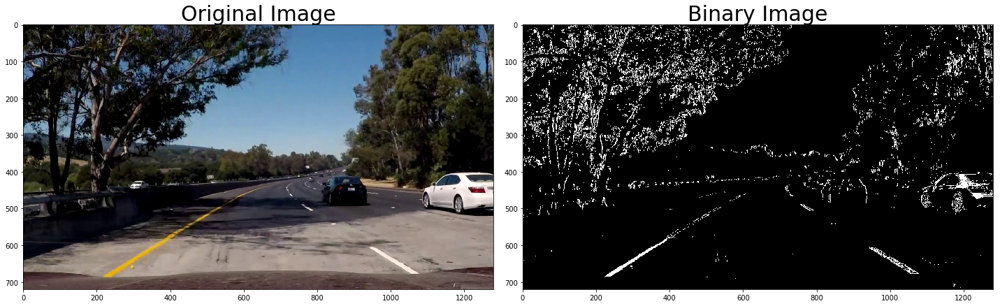

In [9]:
def pipeline(img):
    #Imf is undistorted image
    # Convert to HLS color space and separate the S channel
    hls = hls_image(img)
    s_channel = hls[:,:,2]
    # Convert to HSV color space and separate the V channel
    hsv = hsv_image(img)
    v_channel = hsv[:,:,2]
    
    
    # Threshold x gradient
    sxbinary = abs_Sobel(img,'x',(30,100))

    # Threshold color channel
    s_thresh_min = 170
    s_thresh_max = 255
    s_binary = binarize(s_channel,(s_thresh_min,s_thresh_max))
    
    v_thresh_min = 170
    v_thresh_max = 255
    v_binary = binarize(v_channel,(v_thresh_min,v_thresh_max))

    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[((s_binary == 1) & (v_binary==1))  | (sxbinary == 1) ] = 1
    return combined_binary

#Visualize Combined Binary Image
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image',fontsize=30)
ax2.imshow(pipeline(img),cmap='gray')
ax2.set_title('Binary Image',fontsize=30)
plt.savefig('output_images/binary_image.png')


Histogram Peaks
---


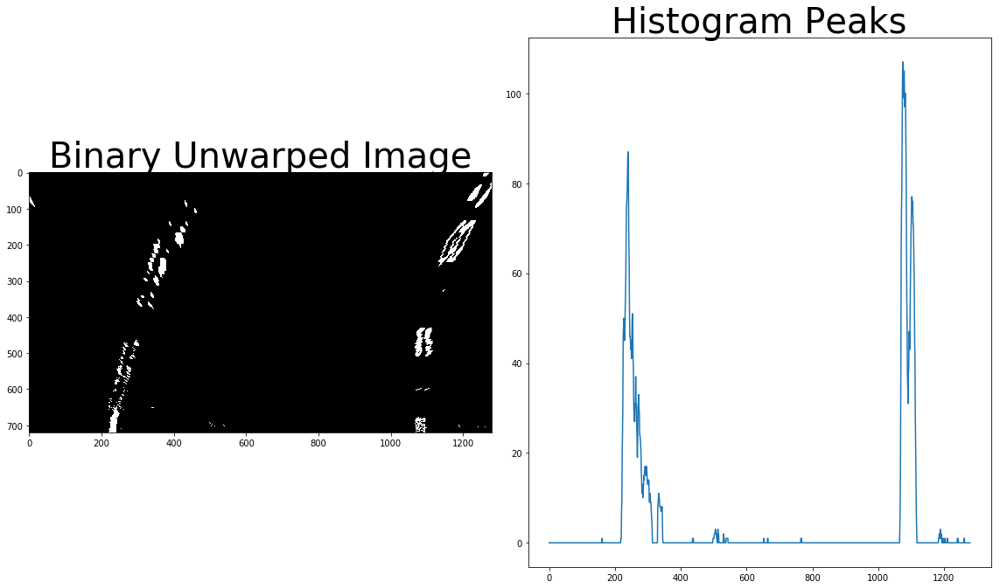

In [10]:
def hist(img):
    # Lane lines are likely to be mostly vertical nearest to the car
    bottom_half =img[img.shape[0]//2:,:]

    # Sum across image pixels vertically 
    # i.e. the highest areas of vertical lines should be larger values
    histogram = np.sum(bottom_half,axis=0)
    
    return histogram

#images = glob.glob('test_images/*.jpg')
binary_warped=[]
#for idx, fname in enumerate(images):
#img = mpimg.imread(fname)    
result=pipeline(img)
unwarped_image,Min=unwarp(result)

binary_warped.append(unwarped_image)

histogr=hist(unwarped_image)
f,(ax1,ax2)=plt.subplots(1,2,figsize=(16,9))
f.tight_layout()
ax1.imshow(unwarped_image,cmap='gray')
ax1.set_title('Binary Unwarped Image',fontsize=40)
ax2.plot(histogr)
ax2.set_title('Histogram Peaks',fontsize=40)


Finding lanes-Sliding Window
----

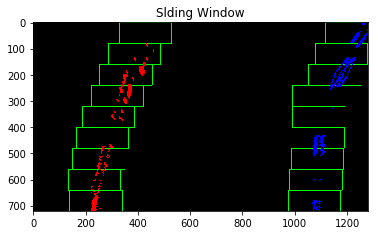

In [11]:
def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img


def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    #print(left_fit)
    #print()
    #print(right_fit)
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines
    #plt.plot(left_fitx, ploty, color='yellow')
    #plt.plot(right_fitx, ploty, color='yellow')

    return out_img,left_fit,right_fit,ploty,left_fitx,right_fitx

#Visualization
for i in range(len(binary_warped)):
    test_img=binary_warped[i]
    out_img,left_fit,right_fit,ploty,left_fitx,right_fitx=fit_polynomial(test_img)
    plt.imshow(out_img)
    plt.title('Slding Window')
    plt.show()



Search around Poly
---

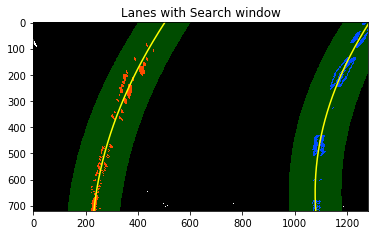

In [12]:
def fit_poly(img_shape, leftx, lefty, rightx, righty):
     ### TO-DO: Fit a second order polynomial to each with np.polyfit() ###
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    ### TO-DO: Calc both polynomials using ploty, left_fit and right_fit ###
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return left_fitx, right_fitx, ploty

def search_around_poly(binary_warped):
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    # The quiz grader expects 100 here, but feel free to tune on your own!
    margin = 100

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### TO-DO: Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    ### Hint: consider the window areas for the similarly named variables ###
    ### in the previous quiz, but change the windows to our new search area ###
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    left_fitx, right_fitx, ploty = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    
    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    # Plot the polynomial lines onto the image
    #plt.plot(left_fitx, ploty, color='yellow')
    #plt.plot(right_fitx, ploty, color='yellow')
    ## End visualization steps ##
    
    return result,left_fitx,right_fitx
for i in range(len(binary_warped)):
    test_img=binary_warped[i]
    out_img,left_fit,right_fit,ploty,left_fitx,right_fitx=fit_polynomial(test_img)
    result,non,nom=search_around_poly(test_img)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.imshow(result)
    plt.title('Lanes with Search window')
    plt.show()
    


Radius of Curvature
---

In [13]:
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension
def measure_curvature_pixels(left_fit,right_fit,ploty,left_fitx,right_fitx):
    '''
    Calculates the curvature of polynomial functions in pixels.
    '''
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    # Calculation of R_curve (radius of curvature)
    left_curverad = ((1 + (2*left_fit[0]*y_eval*ym_per_pix + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval*ym_per_pix + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    
    #Find the vehicle position 
    center = (left_fitx[-1] + right_fitx[-1])//2
    veh_pos=img.shape[1]//2
    
    distance_from_Center = (veh_pos - center)*xm_per_pix # Positive if on right, Negative if on left
    
    
    return left_curverad, right_curverad,distance_from_Center


  

Image Processing Pipeline
===

In [14]:
def process(img):
    #Undistort the image
    undistorted_image=undistort(img)
    #Apply color and Sobel thresholds
    thresholded_image=pipeline(undistorted_image)
    #Apply perspective transform
    binary_warped,Minv=unwarp(thresholded_image)
    
    #Apply sliding window and find the lanes and radius of curvature
    out_img,left_fit,right_fit,ploty,left_fitx,right_fitx=fit_polynomial(binary_warped)
    out_image,l,r=search_around_poly(test_img)
    left_curverad, right_curverad,dx= measure_curvature_pixels(left_fit,right_fit,ploty,left_fitx,right_fitx)
    
    #Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(undistorted_image, 1,newwarp, 0.3, 0)
    
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(result,'Left radius of curvature  = %.2f m'%(left_curverad),(10,50), font, 1.5,(255,255,255),2,cv2.LINE_AA)
    cv2.putText(result,'Right radius of curvature = %.2f m'%(right_curverad),(10,100), font, 1.5,(255,255,255),2,cv2.LINE_AA)
    cv2.putText(result,'Vehicle position : %.2f m %s of center'%(abs(dx), 'left' if dx < 0 else 'right'),(10,150), 
                        font, 1.5,(255,255,255),2,cv2.LINE_AA)
    
    
    return result



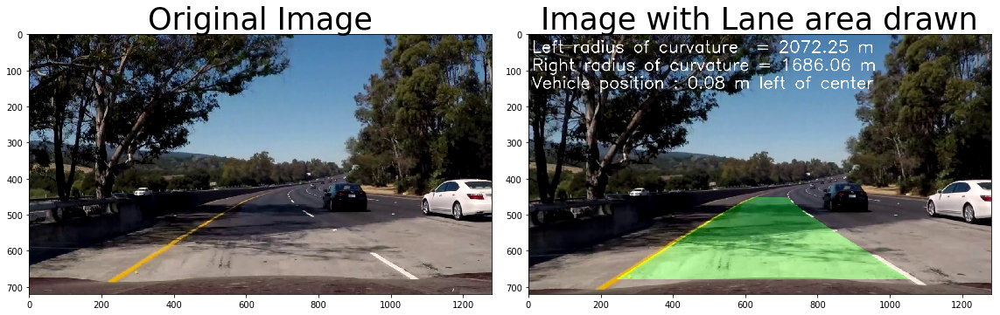

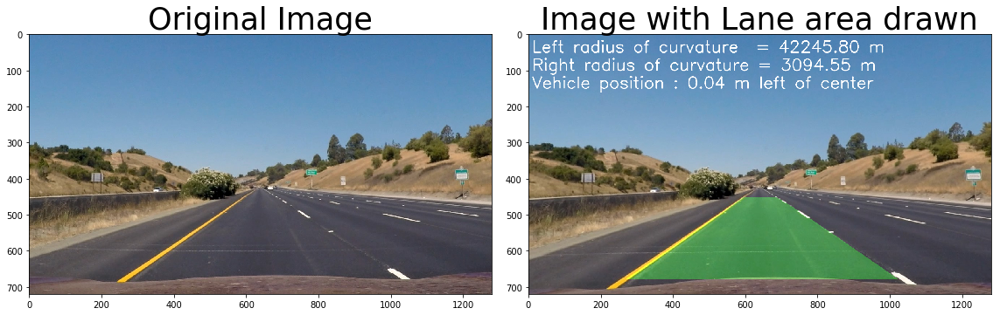

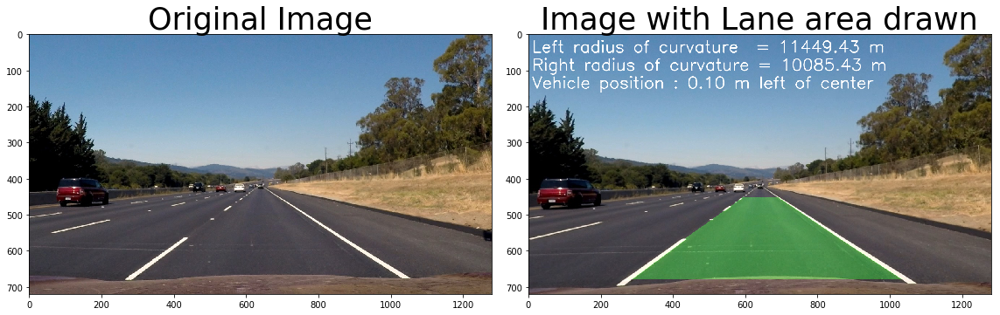

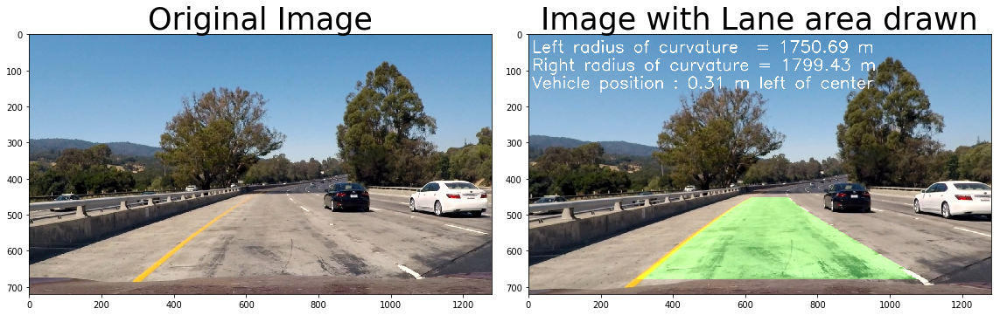

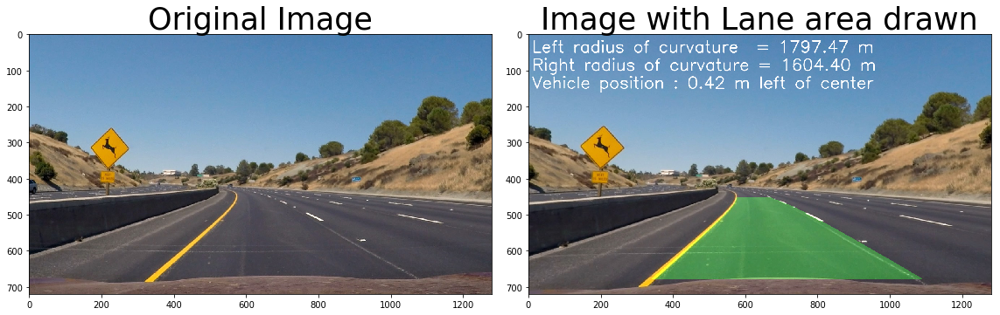

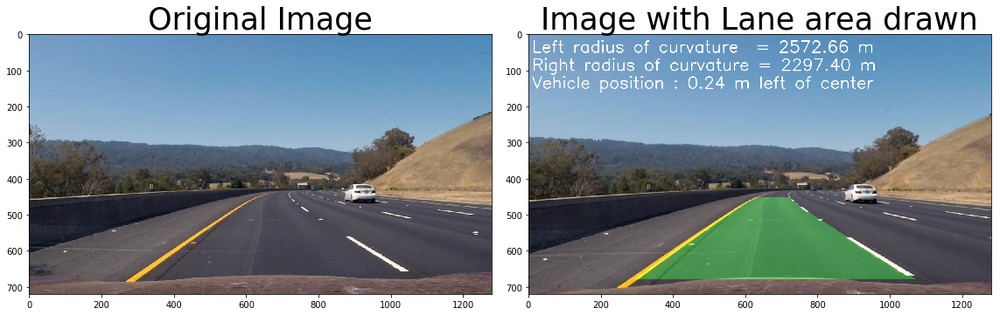

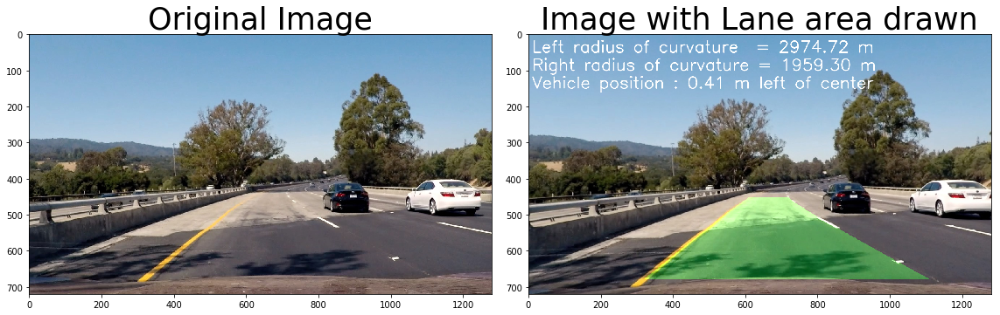

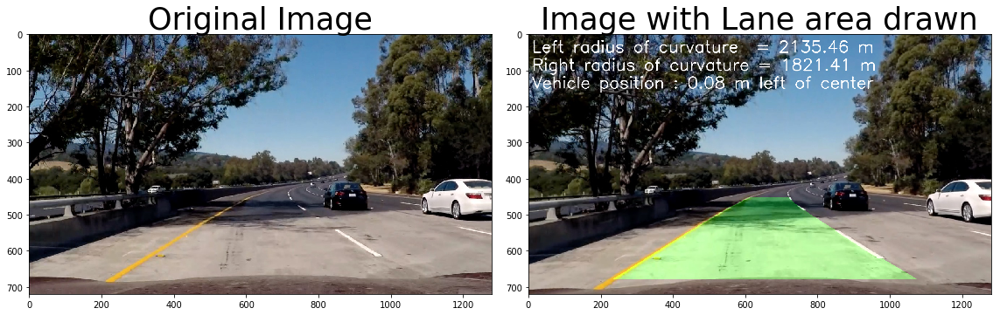

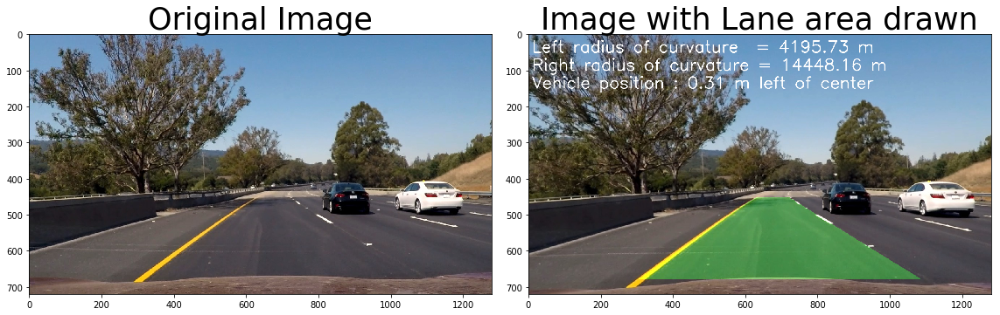

In [15]:
images = glob.glob('test_images/*.jpg')

for idx, fname in enumerate(images):
    img = mpimg.imread(fname)
    result=process(img)
    f,(ax1,ax2)=plt.subplots(1,2,figsize=(16,9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image',fontsize=35)
    ax2.imshow(result)
    ax2.set_title('Image with Lane area drawn',fontsize=35)

Create Video Pipeline
====

In [16]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML


In [17]:
test_output = 'test_videos_output/project_video_output.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(process) #NOTE: this function expects color images!!
%time white_clip.write_videofile(test_output, audio=False)

[MoviePy] >>>> Building video test_videos_output/project_video_output.mp4
[MoviePy] Writing video test_videos_output/project_video_output.mp4


100%|██████████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [02:22<00:00,  8.82it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/project_video_output.mp4 

Wall time: 2min 24s


In [18]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(test_output))